In [1]:
ENV = 'Kaggle' # VAST, Kaggle

In [2]:
# Notes:

# 1- Using the CPU for inference
# 2- Using a Torch hub approach for inference
# 3- The app also uses the CPU and Torch hub when making predictions.
# 4- Scroll down to the section titled "Summary" for the results of this review.

In [3]:
import pandas as pd
import numpy as np
import os

import ast

import cv2
import time
import shutil

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import torchvision
import torchvision.transforms as transforms

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

from torch.utils.data import Dataset, DataLoader

#from tqdm import tqdm

# tqdm doesn't work well in colab.
# This is the solution:
# https://stackoverflow.com/questions/41707229/tqdm-printing-to-newline
import tqdm.notebook as tq
#for i in tq.tqdm(...):

from tqdm import tqdm

import gc


import albumentations as albu
from albumentations import Compose


from sklearn import model_selection
from sklearn.utils import shuffle
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report, jaccard_score
import itertools


# load image with Pillow
from PIL import Image

from numpy import asarray

from skimage.transform import resize


import matplotlib.pyplot as plt
%matplotlib inline


# Don't Show Warning Messages
import warnings
warnings.filterwarnings('ignore')

# Note: Pytorch uses a channels-first format:
# [batch_size, num_channels, height, width]

print(torch.__version__)

print(torchvision.__version__)

1.11.0+cpu
0.12.0+cpu


In [4]:
# Set the seed values

import random

# Set the seed value all over the place to make this reproducible.
seed_val = 101

os.environ['PYTHONHASHSEED'] = str(seed_val)
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)
torch.backends.cudnn.deterministic = True

In [5]:
if torch.cuda.is_available():
    print('Num GPUs:', torch.cuda.device_count())
    print('GPU Type:', torch.cuda.get_device_name(0))

In [6]:
IMAGES_FOLDER = 'images'

if ENV == 'VAST':
    
    root = '/root'
    base_path = '/root/global-wheat-head-dataset-2021/gwhd_2021/'
    data_path = '/root/exp_05_df_rows_w_folds.csv'
    images_path = '/root/global-wheat-head-dataset-2021/gwhd_2021/images/'
    

if ENV == 'Kaggle':
    
    root = '/kaggle/working'
    base_path = '../input/global-wheat-head-dataset-2021/gwhd_2021/'
    data_path = '../input/exp05-gwhd-2-prepare-the-data/df_rows_w_folds.csv'
    images_path = '../input/global-wheat-head-dataset-2021/gwhd_2021/images/'
    
print(ENV)

Kaggle


In [7]:
os.listdir('/kaggle/input/smartwheat-data/')

['exp05_df_rows_w_folds.csv', 'exp7_best.pt', 'df_rows.csv', 'exp03_best.pt']

## Config

In [8]:
# This is the fold that Yolo is trained on
CHOSEN_FOLD = 0


# I'm adding a target called 'nothing' because Yolo does not predict a class 
# for images on which it didn't detect anything. This just helps make the analysis
# of the results easier.
CLASS_LIST = ['nothing', 'wheat_head']
LABEL_LIST = [0,1]


IMG_EXT = '.png' # .jpg, .png --> include the dot

# Yolo setup:
NUM_EPOCHS = 3 #100

# The batch size must be a even number when using multiple GPUs
BATCH_SIZE = 24 #110
IMAGE_SIZE = 512 # Yolo will automatically resize the input images to this size.

NUM_CORES = os.cpu_count()
NUM_CORES

4

## Set up Yolov5 - For offline use

The Yolov5 model being used here needs to have the internet turned for training to work. However, it does not need to have the internet on during inference.

In [9]:
# Copy the yolov5 folder from the notebook to  /kaggle/working/
# The folder will be renamed yolov5 when copied.
# The yolov5-v5.0 folder also contains the trained weights.


if os.path.isdir(f'{root}/yolov5') == False:
    
    if ENV == 'Kaggle':
        shutil.copytree('../input/my-yolov5-for-offline-use/yolov5-v5.0', '/kaggle/working/yolov5')
        
    if ENV == 'VAST':
        shutil.copytree('my-yolov5-for-offline-use/yolov5-v5.0', f'{root}/yolov5')

In [10]:
!ls

__notebook__.ipynb  yolov5


## Load the data

In [11]:
path = data_path

df_data = pd.read_csv(path)

print(df_data.shape)

df_data.head()

(275496, 9)


,image_id,BoxesString,domain,target,height,width,source,path,fold
0,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,99 692 160 764,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0
1,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,641 27 697 115,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0
2,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,935 978 1012 1020,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0
3,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,377 834 463 890,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0
4,4563856cc6d75c670eafd86d5eb7245fbe8f273c28f9e3...,654 797 696 837,Arvalis_1,1,1024,1024,train,../input/global-wheat-head-dataset-2021/gwhd_2...,3.0


## Create a column for the bbox info

In [12]:
# Put the bbox info for each image into a list of bbox dicts
# This code assumes one bbox per row in df_data.


bbox_list = []

for i in tqdm(range(0, len(df_data)), total=len(df_data)):
    
    target = df_data.loc[i, 'target']
    box_str = df_data.loc[i, 'BoxesString']
    
    # Split in to list using the space
    coords_list = box_str.split(' ')
    
    if target != 0:
    
        xmin = ast.literal_eval(coords_list[0])
        ymin = ast.literal_eval(coords_list[1])
        xmax = ast.literal_eval(coords_list[2])
        ymax = ast.literal_eval(coords_list[3])
        
        #x = round(xmin)
        #y = round(ymin)
        width = round(xmax - xmin)
        height = round(ymax - ymin)

        bbox_dict ={
            'x': xmin,
            'y': ymin,
            'width': width,
            'height': height
        }

        bbox_list.append(bbox_dict)
        
    else:
        bbox_list.append('none')
        
        
# Add the bbox_list to df_data
df_data['boxes'] = bbox_list

#print(df_data.shape)

#df_data.head()

100%|██████████| 275496/275496 [00:13<00:00, 20824.36it/s]


## Create the train and val sets

In [13]:
# How to choose the fold to train on.

fold_index = CHOSEN_FOLD

df_train = df_data[df_data['fold'] != fold_index]
df_val = df_data[df_data['fold'] == fold_index]

print('Train')
print(len(df_train))
print(df_train['target'].value_counts())
print('')
print('Val')
print(len(df_val))
print(df_val['target'].value_counts())


Train
236311
1    236204
0       107
Name: target, dtype: int64

Val
39185
1    39167
0       18
Name: target, dtype: int64


## Helper functions

In [14]:

# Draw the square dots on the image
def draw_square_dot(image, xmin, ymin, xmax, ymax, dot_width, text=None, line_thickness=20):
    """
    Set text=None to only draw a bbox without
    any text or text background.
    E.g. set text='Balloon' to write a
    title above the bbox.

    Output:
    Returns an image with one dot drawn at the bbox center.
    The title is optional.
    To draw a second bounding box pass the output image
    into this function again.

    """

    w = xmax - xmin
    h = ymax - ymin


    x_cent = round(xmin + w/2)
    y_cent = round(ymin + h/2)
    x1 = x_cent - dot_width
    y1 = y_cent - dot_width
    x2 = x_cent + dot_width
    y2 = y_cent + dot_width

    # Draw the bounding box
    # ......................

    start_point = (x1, y1)
    end_point = (x2, y2)
    bbox_color = (255, 255, 255) # white
    bbox_thickness = line_thickness

    # Draw a filled square
    # -1 will fill the rectangle
    image = cv2.rectangle(image, start_point, end_point, bbox_color, -1)

    # Draw a border around the filled square in a different colour
    bbox_color = (255, 0, 255) # blue border
    image = cv2.rectangle(image, start_point, end_point, bbox_color, bbox_thickness)


    # Draw the background behind the text
    # ....................................

    # Only do this if text is not None.
    if text:
        # Draw the background behind the text
        #text_bground_color = (0, 0, 0)  # black
        #cv2.rectangle(image, (xmin, ymin - 150), (xmin + w, ymin), text_bground_color, -1)

        # Draw the text
        text_color = (255, 255, 255)  # white
        font = cv2.FONT_HERSHEY_DUPLEX
        origin = (xmin, ymin - 30)
        fontScale = 3
        thickness = 10

        image = cv2.putText(image, text, origin, font,
                            fontScale, text_color, thickness, cv2.LINE_AA)

    return image

In [15]:
def draw_dots_on_ground_truth_heads(image, image_id):

    df1 = df_val[df_val['image_id'] == image_id]

    df1 = df1.reset_index(drop=True)

    box_list = list(df1[ 'boxes'])

    print(len(box_list))

    for coords_dict in box_list:

        #coords_dict = ast.literal_eval(coords_dict)

        xmin = coords_dict['x']
        ymin = coords_dict['y']
        height = coords_dict['height']
        width = coords_dict['width']

        xmax = xmin + width
        ymax = ymin + height

        # Draw the bbox on the image
        start_point = (xmin, ymin) 
        end_point = (xmax, ymax) 
        bbox_color = (255, 255, 0) 
        bbox_thickness = 5

        #image = cv2.rectangle(image, start_point, end_point, bbox_color, bbox_thickness)
        dot_width = 10
        image = draw_square_dot(image, xmin, ymin, xmax, ymax, dot_width, text=None, line_thickness=bbox_thickness)

    return image

In [16]:
def draw_dots_on_detected_heads(image1, image_id):   
    
    df2 = df_preds[df_preds['image_id'] == image_id]

    df2 = df2.reset_index(drop=True)

    orig_image_h = 1024
    orig_image_w = 1024


    for j in range(0, len(df2)):

        xmin = df2.loc[j,'xmin']
        ymin = df2.loc[j,'ymin']
        xmax = df2.loc[j,'xmax']
        ymax = df2.loc[j,'ymax']

        # Draw the bbox on the image
        start_point = (xmin, ymin) 
        end_point = (xmax, ymax) 
        bbox_color = (255, 255, 255) # white
        bbox_thickness = 5

        #image1 = cv2.rectangle(image1, start_point, end_point, bbox_color, bbox_thickness)
        dot_width = 10
        image1 = draw_square_dot(image1, xmin, ymin, xmax, ymax, dot_width, text=None, line_thickness=bbox_thickness)
        
    return image1

In [17]:
# Draw two images side by side

def show_true_and_pred_images(image_id):
    
    print(image_id)

    # Image 1
    # --------

    # Load the image
    path = base_path + 'images/' + image_id +'.png'
    image = cv2.imread(path)

    # Convert from BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


    # Display a large image
    plt.figure(figsize=(20,20))

    # Our subplot will contain 2 row and 2 columns
    # plt.subplot(nrows, ncols, plot_number)
    plt.subplot(2, 2, 1)

    image1 = draw_dots_on_ground_truth_heads(image, image_id)

    i = 1
    plt.subplot(1,2,i)

    plt.imshow(image1)
    plt.tight_layout()
    plt.title('true wheat heads', fontsize=30)
    plt.axis('off')


    # Image 2
    # ---------

    # Load the image
    path = base_path + 'images/' + image_id +'.png'
    image = cv2.imread(path)

    # Convert from BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    i = 2
    plt.subplot(1,2,i)

    image2 = draw_dots_on_detected_heads(image, image_id)

    plt.imshow(image2)
    plt.tight_layout()
    plt.title('detected wheat heads', fontsize=30)
    plt.axis('off')

    plt.show()

## Drop duplicate val image_ids

In [18]:
df_unq = df_val.drop_duplicates(subset=['image_id'])

df_unq = df_unq.reset_index(drop=True)

print(df_unq.shape)

#df_unq.head()

(931, 10)


## How to make a torch hub prediction on one image

In [19]:
val_path_list = list(df_unq['path'])

len(val_path_list)

931

In [20]:
# Fix for path error
# https://stackoverflow.com/questions/74328379/typeerror-custom-got-an-unexpected-keyword-argument-path-yolov7
# change path to path_or_model

model = torch.hub.load('/kaggle/working/yolov5/', 'custom', 
                       source='local', path_or_model='/kaggle/input/smartwheat-data/exp7_best.pt', force_reload=True)

Adding autoShape... 


In [21]:
# The device is set automatically. 
# There's no need to send the model to the GPU.

i = 1

image_path = val_path_list[i]

results = model(image_path, size=512)

In [22]:
results.print()

image 1/1: 1024x1024 51 1s
Speed: 124.0ms pre-process, 439.1ms inference, 13.6ms NMS per image at shape (1, 3, 512, 512)


In [23]:
# There are 4 different output formats that can be specified

# xywh
# xywhn - n means noralized
# xyxy
# xyxyn - n means normalized


# The device is already cuda therefore there's no
# need to send the model to the GPU.
outputs = results.xyxy[0]

print(outputs.shape)

outputs

torch.Size([51, 6])


tensor([[6.19466e+02, 2.43401e+02, 7.43268e+02, 3.30554e+02, 7.68583e-01, 1.00000e+00],
        [3.63725e+02, 1.45774e+02, 4.38142e+02, 2.50078e+02, 7.50136e-01, 1.00000e+00],
        [9.23586e+01, 3.64216e+02, 1.70534e+02, 4.19057e+02, 7.42522e-01, 1.00000e+00],
        [8.02747e+02, 1.94505e+02, 8.78982e+02, 2.83059e+02, 7.36211e-01, 1.00000e+00],
        [4.48126e+02, 3.32630e+02, 5.33103e+02, 4.21452e+02, 7.26386e-01, 1.00000e+00],
        [3.00993e+02, 3.56898e+02, 3.85761e+02, 4.53175e+02, 7.16824e-01, 1.00000e+00],
        [2.83809e+02, 1.23463e+02, 3.68238e+02, 2.27552e+02, 7.10685e-01, 1.00000e+00],
        [2.34748e+02, 1.97250e+02, 3.18695e+02, 3.01196e+02, 6.95924e-01, 1.00000e+00],
        [8.39858e+02, 6.69829e+01, 9.24664e+02, 1.53926e+02, 6.95395e-01, 1.00000e+00],
        [2.66753e+02, 6.81932e+02, 3.23814e+02, 7.69567e+02, 6.79927e-01, 1.00000e+00],
        [3.37921e+02, 7.76537e+02, 3.90572e+02, 8.42302e+02, 6.68886e-01, 1.00000e+00],
        [6.04564e+02, 3.67620e+0

In [24]:
outputs = outputs.cpu().detach().numpy()

outputs

array([[     619.47,       243.4,      743.27,      330.55,     0.76858,           1],
       [     363.72,      145.77,      438.14,      250.08,     0.75014,           1],
       [     92.359,      364.22,      170.53,      419.06,     0.74252,           1],
       [     802.75,      194.51,      878.98,      283.06,     0.73621,           1],
       [     448.13,      332.63,       533.1,      421.45,     0.72639,           1],
       [     300.99,       356.9,      385.76,      453.18,     0.71682,           1],
       [     283.81,      123.46,      368.24,      227.55,     0.71069,           1],
       [     234.75,      197.25,       318.7,       301.2,     0.69592,           1],
       [     839.86,      66.983,      924.66,      153.93,     0.69539,           1],
       [     266.75,      681.93,      323.81,      769.57,     0.67993,           1],
       [     337.92,      776.54,      390.57,       842.3,     0.66889,           1],
       [     604.56,      367.62,      671.

In [25]:
cols = ['xmin', 'ymin', 'xmax', 'ymax', 'conf-score', 'class']

df1 = pd.DataFrame(outputs, columns=cols)

print(df1.shape)

df1.head()

(51, 6)


,xmin,ymin,xmax,ymax,conf-score,class
0,619.466187,243.401398,743.268188,330.553925,0.768583,1.0
1,363.724670,145.773529,438.141785,250.077911,0.750136,1.0
2,92.358582,364.216125,170.533936,419.057129,0.742522,1.0
3,802.746643,194.505310,878.981995,283.058746,0.736211,1.0
4,448.126434,332.630005,533.102722,421.451599,0.726386,1.0


In [26]:
image = cv2.imread(image_path)

plt.imshow(image)

In [27]:
df1 = df1.reset_index(drop=True)

for j in range(0, len(df1)):

    xmin = df1.loc[j,'xmin']
    ymin = df1.loc[j,'ymin']
    xmax = df1.loc[j,'xmax']
    ymax = df1.loc[j,'ymax']

    # Draw the bbox on the image
    start_point = (xmin, ymin) 
    end_point = (xmax, ymax) 
    bbox_color = (255, 255, 255) # white
    bbox_thickness = 5

    #image1 = cv2.rectangle(image1, start_point, end_point, bbox_color, bbox_thickness)
    dot_width = 10
    image = draw_square_dot(image, xmin, ymin, xmax, ymax, dot_width, text=None, line_thickness=bbox_thickness)

plt.figure(figsize=(10,10))
plt.imshow(image) 

## How to predict on a batch of images?

Pass a list of image paths to the model.

In [28]:
image_path1 = val_path_list[1]
image_path2 = val_path_list[2]

results = model([image_path1, image_path2], size=512)

outputs = results.xyxy

# How many preds were made?
print(len(outputs))

outputs

2


[tensor([[6.19466e+02, 2.43401e+02, 7.43268e+02, 3.30554e+02, 7.68583e-01, 1.00000e+00],
         [3.63725e+02, 1.45774e+02, 4.38142e+02, 2.50078e+02, 7.50136e-01, 1.00000e+00],
         [9.23586e+01, 3.64216e+02, 1.70534e+02, 4.19057e+02, 7.42522e-01, 1.00000e+00],
         [8.02747e+02, 1.94505e+02, 8.78982e+02, 2.83059e+02, 7.36211e-01, 1.00000e+00],
         [4.48126e+02, 3.32630e+02, 5.33103e+02, 4.21452e+02, 7.26386e-01, 1.00000e+00],
         [3.00993e+02, 3.56898e+02, 3.85761e+02, 4.53175e+02, 7.16824e-01, 1.00000e+00],
         [2.83809e+02, 1.23463e+02, 3.68238e+02, 2.27552e+02, 7.10685e-01, 1.00000e+00],
         [2.34748e+02, 1.97250e+02, 3.18695e+02, 3.01196e+02, 6.95924e-01, 1.00000e+00],
         [8.39858e+02, 6.69829e+01, 9.24664e+02, 1.53926e+02, 6.95395e-01, 1.00000e+00],
         [2.66753e+02, 6.81932e+02, 3.23814e+02, 7.69567e+02, 6.79927e-01, 1.00000e+00],
         [3.37921e+02, 7.76537e+02, 3.90572e+02, 8.42302e+02, 6.68886e-01, 1.00000e+00],
         [6.04564e+02

In [29]:
# This shows that two predictions were made

results.print()

image 1/2: 1024x1024 51 1s
image 2/2: 1024x1024 53 1s
Speed: 53.1ms pre-process, 414.3ms inference, 1.2ms NMS per image at shape (2, 3, 512, 512)


In [30]:
# These are the preds for the first image path
outputs[0]

tensor([[6.19466e+02, 2.43401e+02, 7.43268e+02, 3.30554e+02, 7.68583e-01, 1.00000e+00],
        [3.63725e+02, 1.45774e+02, 4.38142e+02, 2.50078e+02, 7.50136e-01, 1.00000e+00],
        [9.23586e+01, 3.64216e+02, 1.70534e+02, 4.19057e+02, 7.42522e-01, 1.00000e+00],
        [8.02747e+02, 1.94505e+02, 8.78982e+02, 2.83059e+02, 7.36211e-01, 1.00000e+00],
        [4.48126e+02, 3.32630e+02, 5.33103e+02, 4.21452e+02, 7.26386e-01, 1.00000e+00],
        [3.00993e+02, 3.56898e+02, 3.85761e+02, 4.53175e+02, 7.16824e-01, 1.00000e+00],
        [2.83809e+02, 1.23463e+02, 3.68238e+02, 2.27552e+02, 7.10685e-01, 1.00000e+00],
        [2.34748e+02, 1.97250e+02, 3.18695e+02, 3.01196e+02, 6.95924e-01, 1.00000e+00],
        [8.39858e+02, 6.69829e+01, 9.24664e+02, 1.53926e+02, 6.95395e-01, 1.00000e+00],
        [2.66753e+02, 6.81932e+02, 3.23814e+02, 7.69567e+02, 6.79927e-01, 1.00000e+00],
        [3.37921e+02, 7.76537e+02, 3.90572e+02, 8.42302e+02, 6.68886e-01, 1.00000e+00],
        [6.04564e+02, 3.67620e+0

## What happens if the model does not detect any wheat heads?

This is what the ouput will be if the model does not detect any wheat heads on the image.

In [31]:
# Filter out images that don't have wheat heads
df = df_val[df_val['target'] == 0]
df = df.reset_index(drop=True)

# Get the path to one image
image_path = df.loc[1, 'path']

# Make a prediction
results = model(image_path, size=512)

In [32]:
# Check the output
outputs = results.xyxy[0]

outputs

tensor([], size=(0, 6))

In [33]:
# Check the shape of the output

outputs.shape

torch.Size([0, 6])

## Predict on all val images

Here we are not batching. We are predicting on one image at a time.

In [34]:
# Define the inference function

def inference_fn(df, model, image_size):

    for i in tqdm(range(0, len(df)), total=len(df)):
                  
        image_id = df.loc[i, 'image_id']
        image_path = df.loc[i, 'path']

        results = model(image_path, size=image_size)
                  
        outputs = results.xyxy[0]
        
        # If no wheat heads were detected on the image then
        # the shape of the output will be (0, 6).
        if outputs.shape[0] == 0:
            
            # Create a dataframe
            empty_dict = {
                'xmin': ['None'], 
                'ymin': ['None'], 
                'xmax': ['None'], 
                'ymax': ['None'], 
                'conf-score': ['None'], 
                'class': ['None']
            }
            
            df1 = pd.DataFrame(empty_dict)
            
            # Add the image_id column
            df1['image_id'] = image_id
            
        else:
            # convert to numpy so we can stack the batches.
            outputs = outputs.cpu().detach().numpy()

            # Create a dataframe
            cols = ['xmin', 'ymin', 'xmax', 'ymax', 'conf-score', 'class']
            df1 = pd.DataFrame(outputs, columns=cols)

            # Add the image_id column
            df1['image_id'] = image_id
            
        
        # stack the preds from each batch
        if i == 0:
            df_fin = df1
        else:
            df_fin = pd.concat([df_fin, df1], axis=0)

    return df_fin

In [35]:
# Make a prediction

df_preds = inference_fn(df_unq, model, IMAGE_SIZE)


100%|██████████| 931/931 [07:34<00:00,  2.05it/s]


In [36]:
print(df_preds.shape)

df_preds.head()

(39556, 7)


,xmin,ymin,xmax,ymax,conf-score,class,image_id
0,700.214844,137.573257,808.320923,322.310181,0.70817,1.0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...
1,796.983948,177.046432,885.654724,317.378479,0.66997,1.0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...
2,482.81131,213.173172,602.809937,372.223694,0.657157,1.0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...
3,702.434448,56.598068,848.745361,199.819626,0.636033,1.0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...
4,5.631393,77.703796,159.927689,188.317017,0.632239,1.0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...


## Filter out rows where no wheat heads were predicted

In [37]:
# Filter out the rows where the model did not predict any wheat heads
df_preds0 = df_preds[df_preds['xmin'] == 'None']

df_preds0.shape

df_preds0.head()

,xmin,ymin,xmax,ymax,conf-score,class,image_id
0,None,None,None,None,None,None,894bab6a5148f0e9d98105ca69a3634dccad462422f8df...
0,None,None,None,None,None,None,c82496582a9a410fc87e3ed766dc03135a867ee041b3ed...
0,None,None,None,None,None,None,85fc18aa3f405296db7abbb320ea5653d6855fb2533e10...
0,None,None,None,None,None,None,7cf68949aa01efc6dce1c58247f550d986fec20c15d947...
0,None,None,None,None,None,None,17528cba85011bb2c82d5e223407c0a2c599bc18f35b6d...


In [38]:
# Filter out all rows where the model predicted wheat heads

df_preds = df_preds[df_preds['xmin'] != 'None']

df_preds = df_preds.reset_index(drop=True)

print(df_preds.shape)

df_preds.head()

(39539, 7)


,xmin,ymin,xmax,ymax,conf-score,class,image_id
0,700.214844,137.573257,808.320923,322.310181,0.70817,1.0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...
1,796.983948,177.046432,885.654724,317.378479,0.66997,1.0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...
2,482.81131,213.173172,602.809937,372.223694,0.657157,1.0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...
3,702.434448,56.598068,848.745361,199.819626,0.636033,1.0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...
4,5.631393,77.703796,159.927689,188.317017,0.632239,1.0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...


## Get the num true heads on each image

In [39]:
def get_num_bboxes(x):
    
    if x == 'no_box':
        return 0
    
    else:
    
        # Create a list of bbox coords.
        # Each list item is a string
        box_list = x.split(';')

        num_bboxes = len(box_list)

        return num_bboxes

df_val['num_bboxes'] = df_val['BoxesString'].apply(get_num_bboxes)

#df_val.head()

In [40]:
val_image_id_list = list(df_val['image_id'].unique())

num_list = []
domain_list = []

for image_id in val_image_id_list:
    
    df = df_val[df_val['image_id'] == image_id]
    df = df.reset_index(drop=True)
    
    num_boxes = df['num_bboxes'].sum()
    domain = df.loc[0, 'domain']
    
    num_list.append(num_boxes)
    domain_list.append(domain)

## Create df_boxes

In [41]:
info_dict = {
    'image_id': val_image_id_list,
    'domain': domain_list,
    'num_true_boxes': num_list
}

df_boxes = pd.DataFrame(info_dict)

df_boxes.head()

,image_id,domain,num_true_boxes
0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...,Arvalis_1,43
1,68b0c06932935f8df33a351174e1e3ab0d6f058b64e4f9...,Arvalis_1,50
2,5fd9a56aa2620ccc0ef158d66cd5065c0c41b7dc897ff8...,Arvalis_1,52
3,bacd773ca3950074b36218aa5f1c477101a17ee83bb96c...,Arvalis_1,46
4,12421504268e0c36e905ea12119c44d3c3f19cbc2270ab...,Arvalis_1,50


## Add a column for the Development stage

In [42]:
# Load the metadata

path = base_path + 'metadata_dataset.csv'
df_meta = pd.read_csv(path, sep=';')

print(df_meta.shape)

df_meta.head()

(47, 4)


,name,country,location,development_stage
0,Ethz_1,Switzerland,Usask,Filling
1,Rres_1,UK,Rothamsted,Filling - Ripening
2,ULiège-GxABT_1,Belgium,Gembloux,Ripening
3,NMBU_1,Norway,NMBU,Filling
4,NMBU_2,Norway,NMBU,Ripening


In [43]:
# Convert the domain/name to lowercase e.g. Ethz_1 does not match ETHZ_1

def convert_to_lowercase(x):
    
    lower_str = x.lower()
    
    return lower_str


df_meta['name'] = df_meta['name'].apply(convert_to_lowercase)

df_boxes['domain'] = df_boxes['domain'].apply(convert_to_lowercase)

In [44]:
df_meta = df_meta.set_index('name')

dev_stage_list = []

for i in range(0, len(df_boxes)):
    
    domain = df_boxes.loc[i, 'domain']
    
    dev_stage = df_meta.loc[domain, 'development_stage']
    
    dev_stage_list.append(dev_stage)
    

df_boxes['dev_stage'] = dev_stage_list

df_boxes.head()

,image_id,domain,num_true_boxes,dev_stage
0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...,arvalis_1,43,Post-flowering
1,68b0c06932935f8df33a351174e1e3ab0d6f058b64e4f9...,arvalis_1,50,Post-flowering
2,5fd9a56aa2620ccc0ef158d66cd5065c0c41b7dc897ff8...,arvalis_1,52,Post-flowering
3,bacd773ca3950074b36218aa5f1c477101a17ee83bb96c...,arvalis_1,46,Post-flowering
4,12421504268e0c36e905ea12119c44d3c3f19cbc2270ab...,arvalis_1,50,Post-flowering


In [45]:
# Note the duplicate "Post-flowering/Post-Flowering" name.
# We will need to set all development stage names to lower case.

df_boxes['dev_stage'].value_counts()

Filling               346
Filling - Ripening    256
Ripening              200
Post-flowering        102
multiple               19
Post-Flowering          8
Name: dev_stage, dtype: int64

## Add pred data to df_boxes

In [46]:
pred_image_id_list = list(df_preds['image_id'].unique())

num_list = []

for image_id in val_image_id_list:
    
    if image_id in pred_image_id_list:
        
        df = df_preds[df_preds['image_id'] == image_id]
        num_boxes = len(df)
        
        num_list.append(num_boxes)
        
    else:
        
        num_list.append(0)

In [47]:
df_boxes['num_pred_boxes'] = num_list

df_boxes.head()

,image_id,domain,num_true_boxes,dev_stage,num_pred_boxes
0,be1652110a44acd24b42784356e965ce84a04893c3f1bb...,arvalis_1,43,Post-flowering,49
1,68b0c06932935f8df33a351174e1e3ab0d6f058b64e4f9...,arvalis_1,50,Post-flowering,51
2,5fd9a56aa2620ccc0ef158d66cd5065c0c41b7dc897ff8...,arvalis_1,52,Post-flowering,53
3,bacd773ca3950074b36218aa5f1c477101a17ee83bb96c...,arvalis_1,46,Post-flowering,48
4,12421504268e0c36e905ea12119c44d3c3f19cbc2270ab...,arvalis_1,50,Post-flowering,50


## Get the mean percentage difference

In [48]:
df_boxes['diff'] = abs(df_boxes['num_true_boxes'] - df_boxes['num_pred_boxes'])
df_boxes['count_error'] = df_boxes['diff']/df_boxes['num_true_boxes']

# Remove the rows with no true boxes
df = df_boxes[df_boxes['num_true_boxes'] != 0]

#df.head()

In [49]:
df['count_error'].mean()

0.09105188752740286

## Group by domain

In [50]:
# Group and take the mean
df_domains = df.groupby('domain').mean()

# Only show certain columns
cols = ['diff', 'count_error']
df_domains = df_domains[cols]

df_domains['count_error'] = df_domains['count_error']

# Sort by percentage diff
df_domains = df_domains.sort_values(by=['count_error'])

In [51]:
domain_list = list(df_domains.index)

dev_list = []
country_list = []
location_list = []

for domain in domain_list:
    
    dev_stage = df_meta.loc[domain, 'development_stage']
    country = df_meta.loc[domain, 'country']
    location = df_meta.loc[domain, 'location']
    
    dev_list.append(dev_stage)
    country_list.append(country)
    location_list.append(location)
    
    
df_domains['dev_stage'] = dev_list
df_domains['country'] = country_list
df_domains['location'] = location_list

# Rename the diff column with a name that's easier to understand
df_domains['num_heads_diff'] = list(df_domains['diff'])

# Remove the diff column
df_domains = df_domains.drop('diff', axis=1)

# Change the column order
new_cols = ['count_error', 'dev_stage', 'country', 'location']
df_domains = df_domains[new_cols]

# Save as a csv file
path = 'df_domains.csv'
df_domains.to_csv(path, index=False)

df_domains.head(50)

,count_error,dev_stage,country,location
domain,,,,
nau_2,0.025917,Post-flowering,China,Baima
arvalis_7,0.029724,Filling - Ripening,France,VLB
cimmyt_2,0.038478,Post-flowering,Mexico,Ciudad Obregon
arvalis_6,0.042522,Filling - Ripening,France,VSC
arvalis_9,0.046540,Ripening,France,VLB
nmbu_1,0.050422,Filling,Norway,NMBU
ksu_2,0.052823,Post-flowering,US,KSU
arvalis_10,0.054295,Filling,France,Mons
utokyo_2,0.056263,Ripening,Japan,NARO-Tsukuba


## Group by dev_stage

In [52]:
def convert_to_lower_case(x):
    
    return(x.lower())


df_domains['dev_stage'] = df_domains['dev_stage'].apply(convert_to_lower_case)

In [53]:
df_domains['dev_stage'].value_counts()

filling               14
post-flowering        12
filling - ripening    11
ripening               9
multiple               1
Name: dev_stage, dtype: int64

In [54]:
# Group and take the mean
df_dev = df_domains.groupby('dev_stage').mean()

# Sort by percentage diff
df_dev = df_dev.sort_values(by=['count_error'])


# Save as a csv file
path = 'df_dev.csv'
df_dev.to_csv(path, index=False)

df_dev.head()

,count_error
dev_stage,
filling - ripening,0.083442
post-flowering,0.102431
ripening,0.110694
filling,0.116109
multiple,0.120564


## Sort all preds by count_error

In [55]:
# Sort by count_error
df_sorted = df.sort_values(by=['count_error'])

df_sorted = df_sorted.reset_index(drop=True)

df_sorted.head()

,image_id,domain,num_true_boxes,dev_stage,num_pred_boxes,diff,count_error
0,bc02f06e15dbf65c4dedf12e302d157698d48e9b185afa...,cimmyt_3,28,Post-flowering,28,0,0.0
1,196f86ccb60527d3c562a3d1d95a633038d0de979b5567...,usask_1,42,Filling - Ripening,42,0,0.0
2,019cefe58518cdadb35890227dbb32c7cdf77159d96e4e...,arvalis_4,16,Filling,16,0,0.0
3,6eb1810a7c99e2d398a14ae38d7c2bc60043e6f6d37753...,arvalis_4,16,Filling,16,0,0.0
4,8c1afb1f2088fd978dc5c8f44de1d495fd0ee8e87821c8...,arvalis_4,28,Filling,28,0,0.0


In [56]:
df_sorted.tail()

,image_id,domain,num_true_boxes,dev_stage,num_pred_boxes,diff,count_error
908,a26431764aa26663126b5b70e862d3adcfc15b364df9c2...,terraref_2,6,Filling,1,5,0.833333
909,85fc18aa3f405296db7abbb320ea5653d6855fb2533e10...,terraref_1,1,Ripening,0,1,1.000000
910,894bab6a5148f0e9d98105ca69a3634dccad462422f8df...,arvalis_5,1,Filling,0,1,1.000000
911,c82496582a9a410fc87e3ed766dc03135a867ee041b3ed...,terraref_1,1,Ripening,0,1,1.000000
912,7cf68949aa01efc6dce1c58247f550d986fec20c15d947...,terraref_2,3,Filling,0,3,1.000000


## Display five good results

Each dot is the center of a bounding box.

In [57]:
image_id = '7cf68949aa01efc6dce1c58247f550d986fec20c15d947af8bf64471826a3f2f'

df_sorted[df_sorted['image_id'] == image_id]

,image_id,domain,num_true_boxes,dev_stage,num_pred_boxes,diff,count_error
912,7cf68949aa01efc6dce1c58247f550d986fec20c15d947...,terraref_2,3,Filling,0,3,1.0


59973efe2fd50d63a43ff961a2bae7099f635aede073534f6a346aa5521da740
45


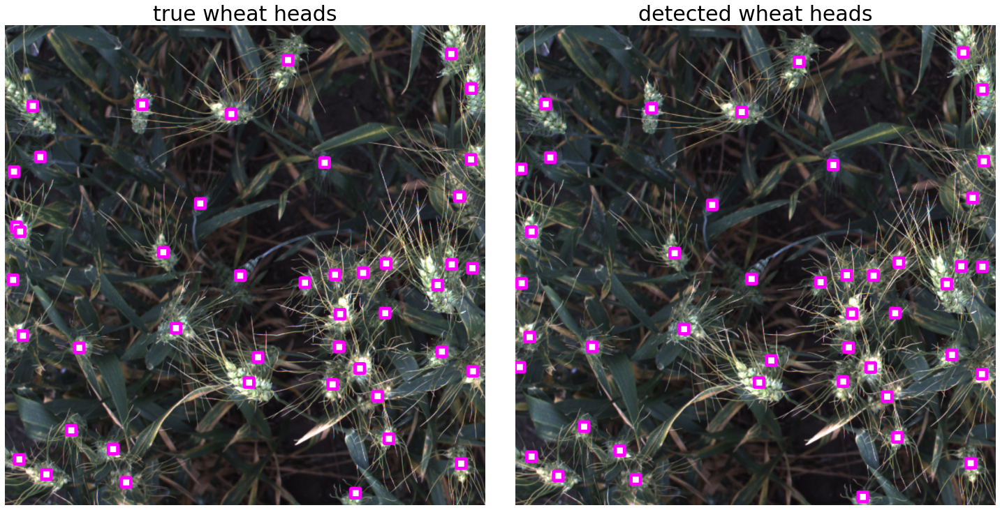

In [58]:
import matplotlib.pyplot as plt
%matplotlib inline

chosen_image_id = 5
image_id = df_sorted.loc[chosen_image_id, 'image_id']

show_true_and_pred_images(image_id)

352410f33c40b09cd7b6b679bd5892e4acdf213adc01961fa41a8b9f4769e80d
27


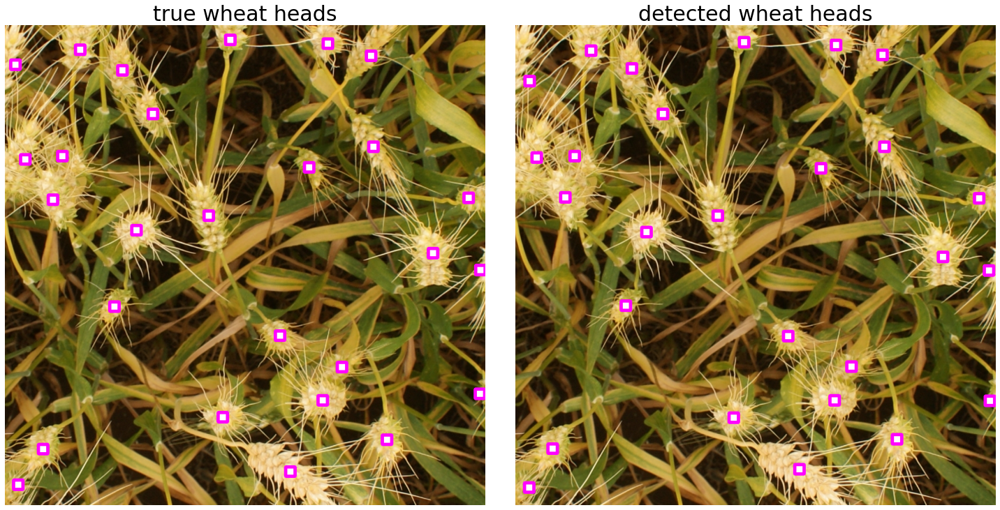

In [59]:
import matplotlib.pyplot as plt
%matplotlib inline

chosen_image_id = 7
image_id = df_sorted.loc[chosen_image_id, 'image_id']

show_true_and_pred_images(image_id)

bf8d5008450d2b32e93e37880fedf9e847ba4def617e229c8ae0878c280e5786
14


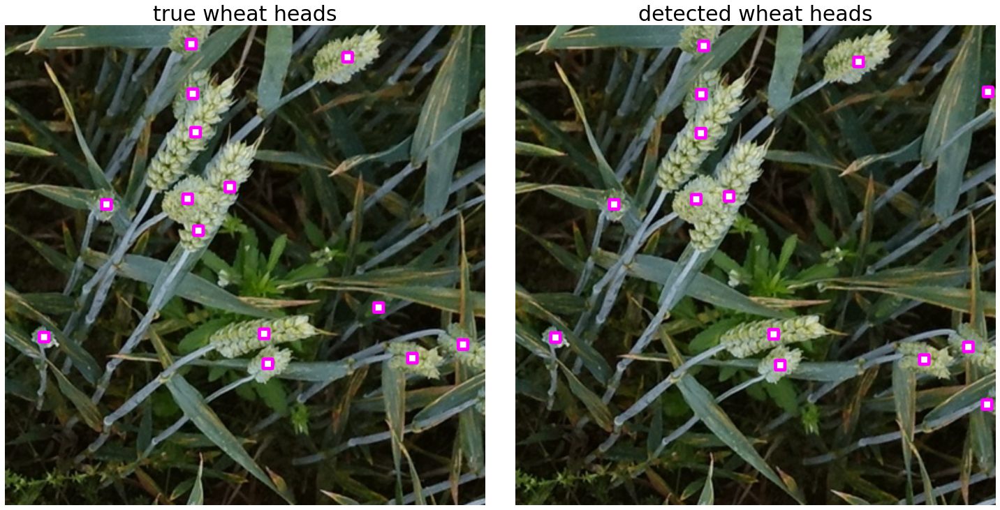

In [60]:
import matplotlib.pyplot as plt
%matplotlib inline

chosen_image_id = 120
image_id = df_sorted.loc[chosen_image_id, 'image_id']

show_true_and_pred_images(image_id)

20d1649beb0899588bc565886f2d403672f5f190ce57d9f8ea10965b83b471d8
6


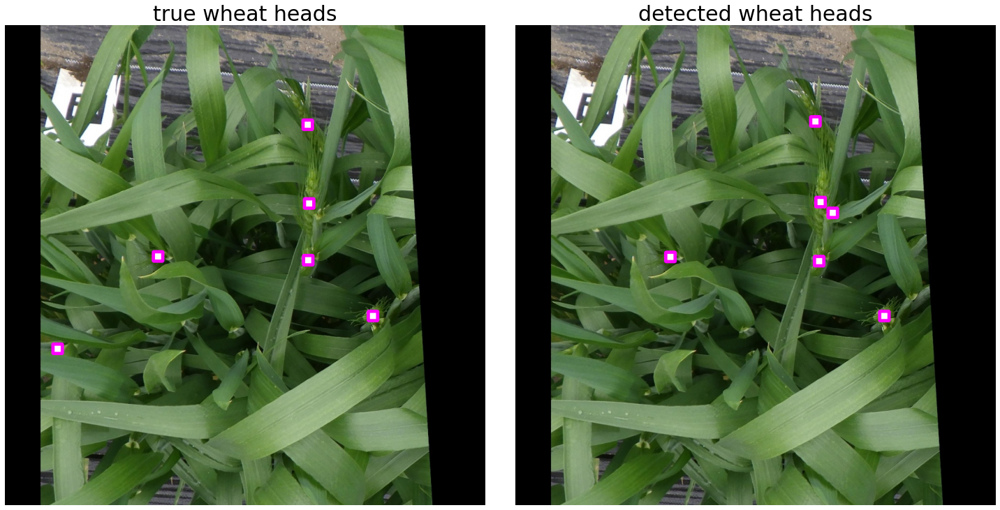

In [61]:
chosen_image_id = 124
image_id = df_sorted.loc[chosen_image_id, 'image_id']

show_true_and_pred_images(image_id)

1a04e9c94d9bcdcb9a73d8fb55be86caec8d3269f021b947c73f467238dafb57
12


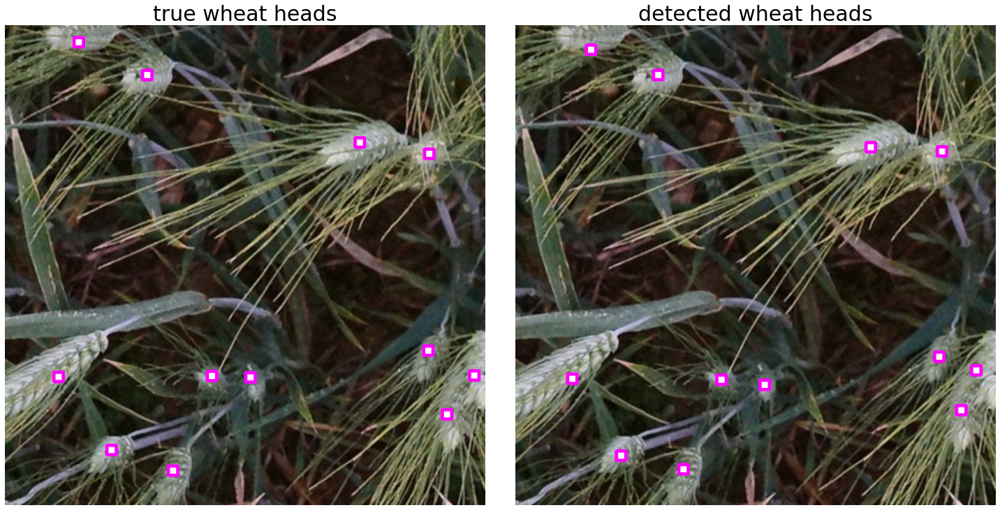

In [62]:
chosen_image_id = 121
image_id = df_sorted.loc[chosen_image_id, 'image_id']

show_true_and_pred_images(image_id)

## Display five bad results

Each dot is the center of a bounding box.

85fc18aa3f405296db7abbb320ea5653d6855fb2533e10be3ad43c87b6fc7666
1


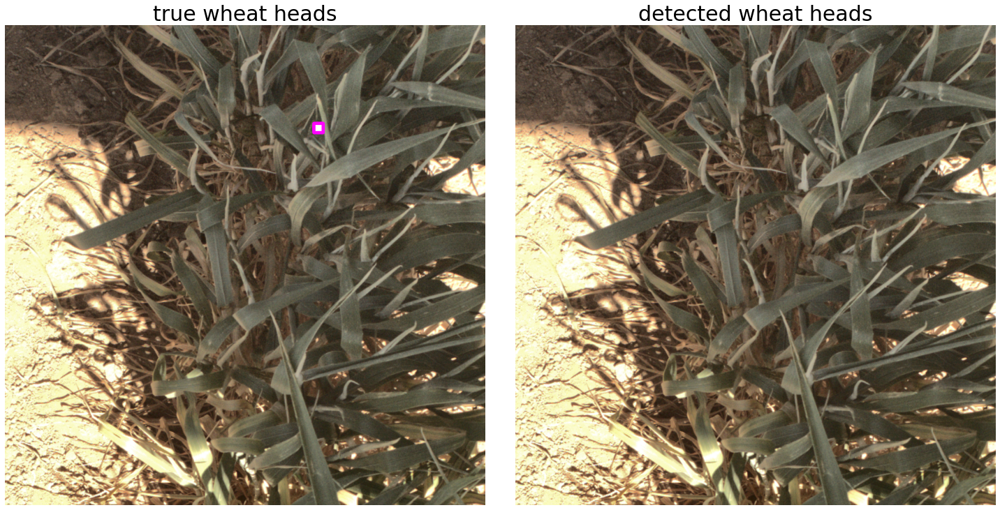

In [63]:
chosen_image_id = 909
image_id = df_sorted.loc[chosen_image_id, 'image_id']

show_true_and_pred_images(image_id)

894bab6a5148f0e9d98105ca69a3634dccad462422f8dfd8544492b754d03904
1


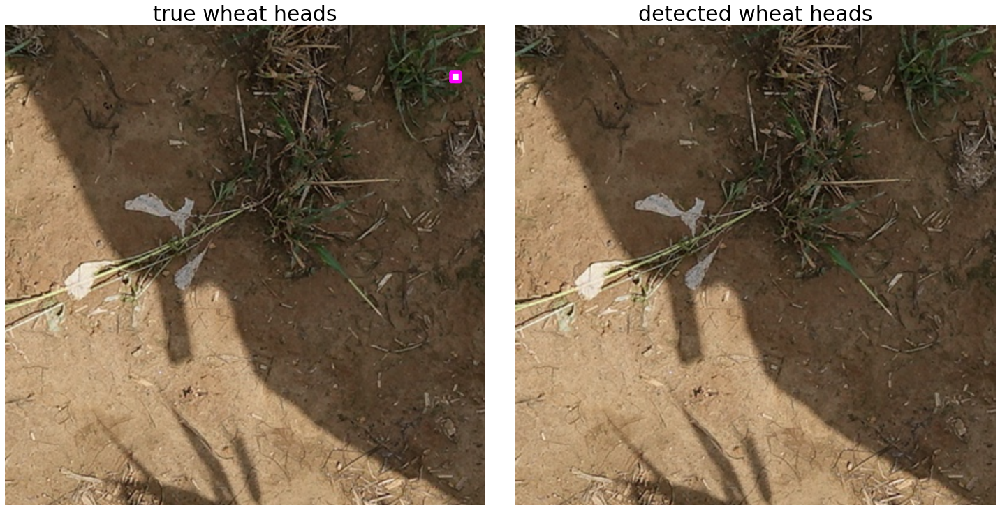

In [64]:
chosen_image_id = 910
image_id = df_sorted.loc[chosen_image_id, 'image_id']

show_true_and_pred_images(image_id)

7cf68949aa01efc6dce1c58247f550d986fec20c15d947af8bf64471826a3f2f
3


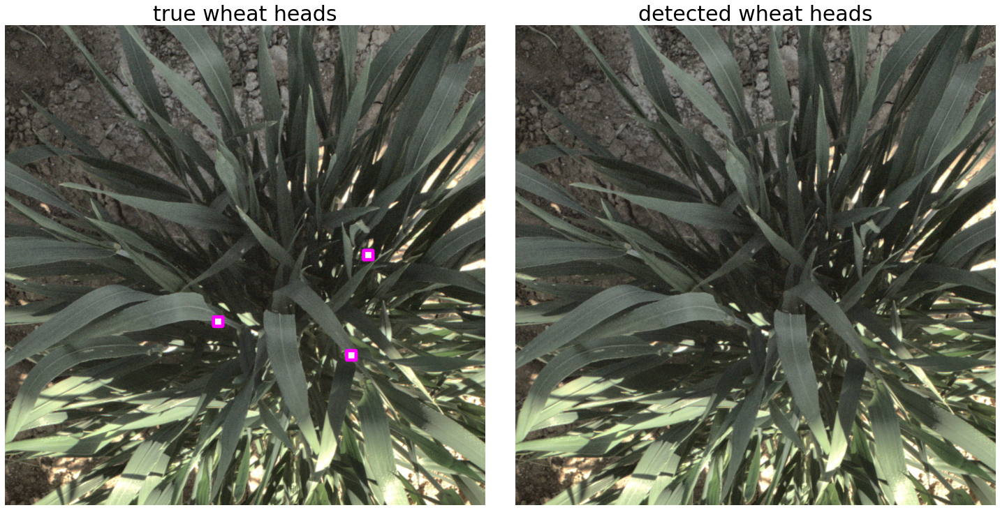

In [65]:
chosen_image_id = 912
image_id = df_sorted.loc[chosen_image_id, 'image_id']

show_true_and_pred_images(image_id)

15aca7f957063f1f4989605540c82ccfb2942bf67c85e8e5dc1a0c31d10d3d35
13


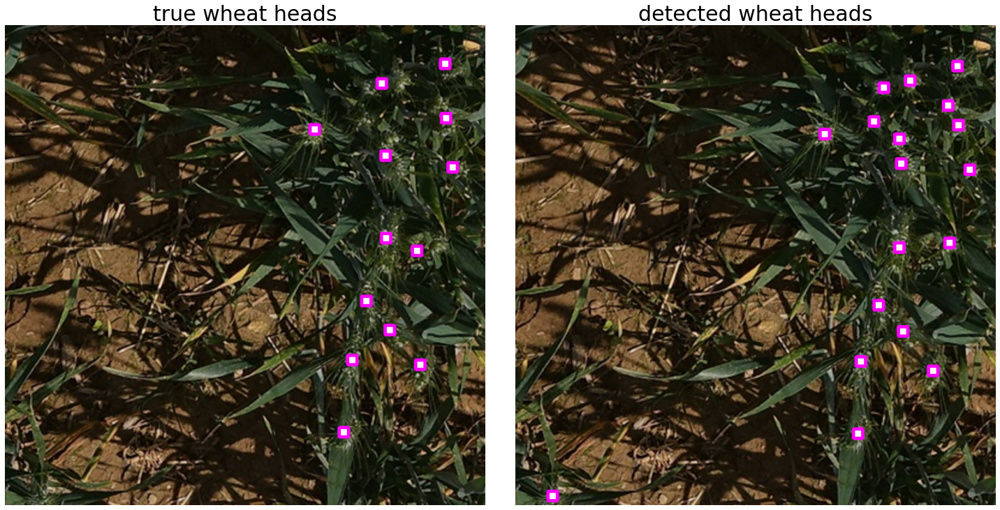

In [66]:
chosen_image_id = 895
image_id = df_sorted.loc[chosen_image_id, 'image_id']

show_true_and_pred_images(image_id)

f443089857e7cbadeecc4b73d1c8a3127ccba3fdafba763a589cbb31701dac0d
54


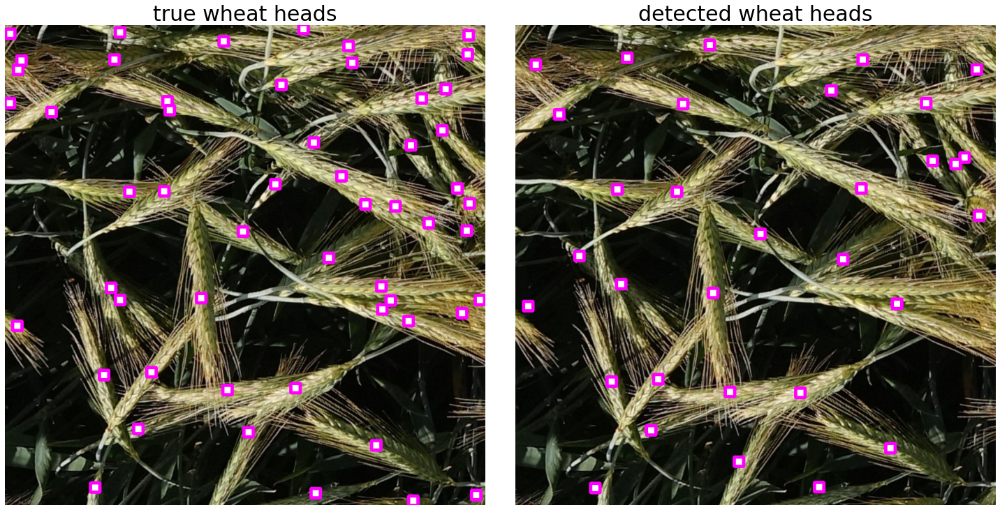

In [67]:
chosen_image_id = 897
image_id = df_sorted.loc[chosen_image_id, 'image_id']

show_true_and_pred_images(image_id)

## Summary

In [68]:
# Mean count error

df_sorted['count_error'].mean()

0.09105188752740288

In [69]:
# Total number of domains

len(df_domains)

47

In [70]:
# Number of domains with count error less than 10%

df = df_domains[df_domains['count_error'] < 0.1]

len(df)

32

In [71]:
# Number of domains with count error less than 20%

df = df_domains[df_domains['count_error'] < 0.2]

len(df)

41

In [72]:
# Development stage sorted by count_error

df_dev.head()

,count_error
dev_stage,
filling - ripening,0.083442
post-flowering,0.102431
ripening,0.110694
filling,0.116109
multiple,0.120564


In [73]:
# Doains sorted by count_error

df_domains.head(50)

,count_error,dev_stage,country,location
domain,,,,
nau_2,0.025917,post-flowering,China,Baima
arvalis_7,0.029724,filling - ripening,France,VLB
cimmyt_2,0.038478,post-flowering,Mexico,Ciudad Obregon
arvalis_6,0.042522,filling - ripening,France,VSC
arvalis_9,0.046540,ripening,France,VLB
nmbu_1,0.050422,filling,Norway,NMBU
ksu_2,0.052823,post-flowering,US,KSU
arvalis_10,0.054295,filling,France,Mons
utokyo_2,0.056263,ripening,Japan,NARO-Tsukuba


## Save df_sorted

In [74]:
path = 'df_sorted.csv'
df_sorted.to_csv(path, index=False)

## Delete images to prevent notebook commit errors

In [75]:
# change the working directory to yolov5

os.chdir(f'{root}/yolov5')

!pwd

/kaggle/working/yolov5


In [76]:
# Delete the folder to prevent a Kaggle error.

if os.path.isdir('base_dir') == True:
    shutil.rmtree('base_dir')

In [77]:
!pip  freeze > requirements.txt

In [78]:
!ls

Dockerfile   hubconf.py        utils				  yolov5m6.pt
LICENSE      models	       weights				  yolov5x.pt
README.md    requirements.txt  yolov5-v5.0-performance-graph.png  yolov5x6.pt
__pycache__  test.py	       yolov5l.pt
data	     train.py	       yolov5l6.pt
detect.py    tutorial.ipynb    yolov5m.pt
